###### This is a markdown cell to describe code functionality
The code below imports all necessary libraries.

In [498]:
# for array manipulation
import random
import numpy as np

# to plot image
import matplotlib.pyplot as plt
plt.style.use("ggplot")
%matplotlib inline
from skimage.io import imshow

# for neural net generation
import tensorflow as tf
from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, LeakyReLU
from keras.layers.convolutional import Conv2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.layers.merge import concatenate
from keras.callbacks import ModelCheckpoint
from keras.optimizers import Adam
from keras.backend import argmax
from keras import backend as K

# to load pixel values
from PIL import Image

# to calculate accuracies
from keras.metrics import accuracy
from sklearn.metrics import confusion_matrix

# to calculate difference
import math

###### This is a markdown cell to describe code functionality
The code below sets the input shape of the neural network.

In [499]:
# all inputs to the neural net will have the following shape
im_width = 320
im_height = 320
channels = 3

###### This is a markdown cell to describe code functionality
The code below sets all path related prefix and postfix.

In [500]:
# ids of the original train images (TOP images) - this images have Ground Truth available within the dataset
ids = [1,3,5,7,11,13,15,17,21,23,26,28,30,32,34]
file_name_prefix = "top_mosaic_09cm_area" # prefix for TOP training images filename
file_name_postfix = ".tif" # postfix for all images
tr_TOP_root = "train/x/" # root for training TOP images
tr_GT_root = "train/y/" # root for training Ground Truth images

aug_tr_TOP_root = "augmented_train/x/" # training TOP images are stored here after augmentation
aug_tr_GT_root = "augmented_train/y/" # training Ground Truth images are stored here after augmentation

best_trained_model = "best_validated_model.hdf5" # the best trained model is saved with this name

te_TOP_root = "test_unet/37_TOP.tif" # root folder for test TOP images
te_GT_root = "test_unet/37_GT.tif" # root folder for test Grount Truth images
aug_te_TOP_root = "augmented_test/x/" # test TOP images are saved here after augmentation
aug_te_GT_root = "augmented_test/y/" # test Ground Truth images are saved here after augmentation

###### This is a markdown cell to describe code functionality
The code below performs training data augmentation. Each training TOP and Ground Truth images are cut into 320x320x3 images and saved in disk.

In [501]:
# data augmentation
total_images = 0
for n in range(0,len(ids)):
    # Load images
    im_x = Image.open(tr_TOP_root+file_name_prefix+str(ids[n])+file_name_postfix)
    x_pixels = im_x.load()
    imgwidth, imgheight = im_x.size
    
    im_y = Image.open(tr_GT_root+file_name_prefix+str(ids[n])+file_name_postfix)
    y_pixels = im_y.load()
    
    i = 0
    while i+im_height-1<imgheight:
        j = 0
        while j+im_width-1<imgwidth:
            # fix the window
            box = (j, i, j+im_width, i+im_height)
            # cut window
            x_segment = im_x.crop(box)
            y_segment = im_y.crop(box)
            # save
            total_images = total_images + 1
            x_segment.save(aug_tr_TOP_root+str(total_images)+file_name_postfix)
            y_segment.save(aug_tr_GT_root+str(total_images)+file_name_postfix)
            # increase j
            j = j + im_width
        # increase i
        i = i + im_height

###### This is a markdown cell to describe code functionality
The code below declares three numpy arrays to store the original TOP images, input normalized TOP images, and normalized Ground Truth images. X and y are used to train the unet.

In [502]:
# declare arrays to store train data
TOP = np.zeros((total_images, im_height, im_width, channels), dtype=np.float32)
X = np.zeros((total_images, im_height, im_width, channels), dtype=np.float32)
Y = np.zeros((total_images, im_height, im_width, channels), dtype=np.float32)

###### This is a markdown cell to describe code functionality

----------------DO NOT EXECUTE-------------------

The code below retrieves the augmented training TOP and Ground Truth images from disk and load into X and Y. However, we kept the augmented images in memory when we first read the original images and avoided reading from disk again as it was causing some distortion in the images. So, no need to execute the code below.

In [162]:
# Don't execute this
for n in range(0,total_images):
    # Load images
    x_image = Image.open(aug_tr_TOP_root+str(n+1)+file_name_postfix)
    x_pixels = x_image.load()
    
    x_img = np.zeros((im_height, im_width, channels), dtype=np.float32)
    
    for i in range(0,im_height):
        for j in range(0,im_width):
            for k in range(0,channels):
                x_img[i][j][k] = x_pixels[j,i][k]
    
    # Load labels
    y_image = Image.open(aug_tr_GT_root+str(n+1)+file_name_postfix)
    y_pixels = y_image.load()
    y_img = np.zeros((im_height, im_width, channels), dtype=np.float32)
    for i in range(0,im_height):
        for j in range(0,im_width):
            for k in range(0,channels):
                y_img[i][j][k] = y_pixels[j,i][k]
    
    # normalize images and store in the initialized arrays
    X[n] = ((x_img/255.0)-0.5)*0.5
    Y[n] = ((y_img/255.0)-0.5)*0.5


###### This is a markdown cell to describe code functionality
The code below normalizes the augmented TOP and Ground Truth images into the TOP, X, and Y array. While inserting into TOP, the TOP images are normalized between 0 and 1. However, while inserting into X and Y, the TOP and Ground Truth images were normalized to have mean 0.5 and std 0.5.

In [503]:
t = 0
for n in range(0,len(ids)):
    # Load images
    im_x = Image.open(tr_TOP_root+file_name_prefix+str(ids[n])+file_name_postfix)
    x_pixels = im_x.load()
    imgwidth, imgheight = im_x.size
    
    im_y = Image.open(tr_GT_root+file_name_prefix+str(ids[n])+file_name_postfix)
    y_pixels = im_y.load()
    
    i = 0
    while i+im_height-1<imgheight:
        j = 0
        while j+im_width-1<imgwidth:
            x_segment = np.zeros((im_height, im_width, channels), dtype=np.float32)
            y_segment = np.zeros((im_height, im_width, channels), dtype=np.float32)
        
            x = 0
            for m in range(i,i+im_height):
                y = 0
                for n in range(j,j+im_width):
                    for o in range(0,channels):
                        x_segment[x][y][o] = x_pixels[n,m][o]
                        y_segment[x][y][o] = y_pixels[n,m][o]
                    y = y + 1
                x = x + 1
            # add to train after normalization
            TOP[t] = x_segment/255.0
            X[t] = ((x_segment/255.0)-0.5)*0.5
            Y[t] = ((y_segment/255.0)-0.5)*0.5
            t = t+1
            
            # increase j
            j = j + im_width
        # increase i
        i = i + im_height

###### This is a markdown cell to describe code functionality
The below code visualizes one of the original TOP images, normalized TOP images for unet input and normalized Ground Truth.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Ground Truth - y')

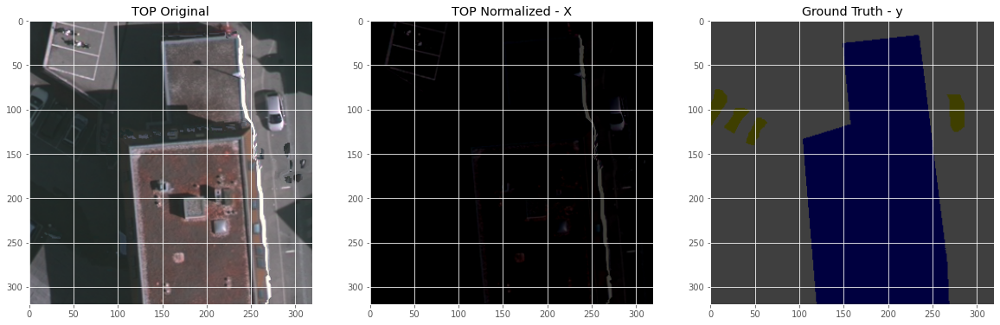

In [504]:
# Visualize random train image along with the mask
index = 0

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize = (20, 15))

ax1.imshow(TOP[index])
ax1.set_title('TOP Original')

ax2.imshow(X[index].squeeze())
ax2.set_title('TOP Normalized - X')

ax3.imshow(Y[index].squeeze())
ax3.set_title('Ground Truth - y')

###### This is a markdown cell to describe code functionality
The code below designc the unet architecture described in the paper under our consideration. The details of the net can be found in the report. Different parameters are directly adopted from the paper. No modification was made.

In [505]:
hl_negative_slope = 0.2
def unet(pretrained_weights = None,input_size = (320,320,3)):
    # input layer
    inputs = Input(input_size) # input layer
    
    #############
    # encoder
    
    # first encoder layer
    conv1 = Conv2D(64, 3, strides=1, padding = 'same')(inputs)
    conv1 = LeakyReLU(alpha=hl_negative_slope)(conv1)
    conv1 = BatchNormalization()(conv1)
    conv1 = Conv2D(64, 3, strides=1, padding = 'same')(conv1)
    conv1 = LeakyReLU(alpha=hl_negative_slope)(conv1)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPooling2D(pool_size=(3, 3), strides=2 , padding = 'same')(conv1)
    
    # second encoder layer
    conv2 = Conv2D(128, 3,  strides=1, padding = 'same')(pool1)
    conv2 = LeakyReLU(alpha=hl_negative_slope)(conv2)
    conv2 = BatchNormalization()(conv2)
    conv2 = Conv2D(128, 3, strides = 1, padding = 'same')(conv2)
    conv2 = LeakyReLU(alpha=hl_negative_slope)(conv2)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPooling2D(pool_size=(3, 3), strides = 2, padding = 'same')(conv2)
    
    # third encoder layer
    conv3 = Conv2D(256, 3, strides=1, padding = 'same')(pool2)
    conv3 = LeakyReLU(alpha=hl_negative_slope)(conv3)
    conv3 = BatchNormalization()(conv3)
    conv3 = Conv2D(256, 3, strides=1, padding = 'same')(conv3)
    conv3 = LeakyReLU(alpha=hl_negative_slope)(conv3)
    conv3 = BatchNormalization()(conv3)
    pool3 = MaxPooling2D(pool_size=(3, 3), strides = 2, padding = 'same')(conv3)
    
    # fourth encoder layer
    conv4 = Conv2D(512, 3, strides=1, padding = 'same')(pool3)
    conv4 = LeakyReLU(alpha=hl_negative_slope)(conv4)
    conv4 = BatchNormalization()(conv4)
    conv4 = Conv2D(512, 3, strides=1, padding = 'same')(conv4)
    conv4 = LeakyReLU(alpha=hl_negative_slope)(conv4)
    conv4 = BatchNormalization()(conv4)
    pool4 = MaxPooling2D(pool_size=(3, 3), strides = 2, padding = 'same')(conv4)
    
    # fifth encoder layer / bridge
    conv5 = Conv2D(1024, 3, strides=1, padding = 'same')(pool4)
    conv5 = LeakyReLU(alpha=hl_negative_slope)(conv5)
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv2D(1024, 3, strides=1, padding = 'same')(conv5)
    conv5 = LeakyReLU(alpha=hl_negative_slope)(conv5)
    conv5 = BatchNormalization()(conv5)
    
    
    #############
    
    # decoder

    # first decoder layer
    up6 = Conv2DTranspose(256, 3, strides = 2, padding = 'same')(conv5)
    up6 = LeakyReLU(alpha=hl_negative_slope)(up6)
    up6 = BatchNormalization()(up6)
    merge6 = concatenate([conv4,up6], axis = 3)
    conv6 = Conv2D(512, 3, strides=1, padding = 'same')(merge6)
    conv6 = LeakyReLU(alpha=hl_negative_slope)(conv6)
    conv6 = BatchNormalization()(conv6)
    conv6 = Conv2D(512, 3, strides=1, padding = 'same')(conv6)
    conv6 = LeakyReLU(alpha=hl_negative_slope)(conv6)
    conv6 = BatchNormalization()(conv6)

    # second decoder layer
    up7 = Conv2DTranspose(256, 3, strides = 2, padding = 'same')(conv6)
    up7 = LeakyReLU(alpha=hl_negative_slope)(up7)
    up7 = BatchNormalization()(up7)
    merge7 = concatenate([conv3,up7])
    conv7 = Conv2D(256, 3, strides=1, padding = 'same')(merge7)
    conv7 = LeakyReLU(alpha=hl_negative_slope)(conv7)
    conv7 = BatchNormalization()(conv7)
    conv7 = Conv2D(256, 3, strides=1, padding = 'same')(conv7)
    conv7 = LeakyReLU(alpha=hl_negative_slope)(conv7)
    conv7 = BatchNormalization()(conv7)

    # third decoder layer
    up8 = Conv2DTranspose(128, 3, strides = 2, padding = 'same')(conv7)
    up8 = LeakyReLU(alpha=hl_negative_slope)(up8)
    up8 = BatchNormalization()(up8)
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(128, 3, strides=1, padding = 'same')(merge8)
    conv8 = LeakyReLU(alpha=hl_negative_slope)(conv8)
    conv8 = BatchNormalization()(conv8)
    conv8 = Conv2D(128, 3, strides=1, padding = 'same')(conv8)
    conv8 = LeakyReLU(alpha=hl_negative_slope)(conv8)
    conv8 = BatchNormalization()(conv8)
    
    # fourth decoder layer
    up9 = Conv2DTranspose(64, 3, strides = 2, padding = 'same')(conv8)
    up9 = LeakyReLU(alpha=hl_negative_slope)(up9)
    up9 = BatchNormalization()(up9)
    merge9 = concatenate([conv1,up9], axis = 3)
    conv9 = Conv2D(64, 3, strides=1, padding = 'same')(merge9)
    conv9 = LeakyReLU(alpha=hl_negative_slope)(conv9)
    conv9 = BatchNormalization()(conv9)
    conv9 = Conv2D(64, 3, strides=1, padding = 'same')(conv9)
    conv9 = LeakyReLU(alpha=hl_negative_slope)(conv9)
    conv9 = BatchNormalization()(conv9)
    
    
    # output layer
    outputs = Conv2D(3, 1, activation='softmax')(conv9)
    
    
    # generate the model with training algorithm
    
    model = Model(input = inputs, output = outputs)

    model.compile(optimizer = Adam(lr = 0.0002), loss = 'categorical_crossentropy', metrics = ['accuracy'])
    
    # show model summary
    
    model.summary()
    
    # if we have any initial weight load that
    
    if(pretrained_weights):
    	model.load_weights(pretrained_weights)
    
    # return the model

    return model

model = unet()

Model: "model_941"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_476 (InputLayer)          (None, 320, 320, 3)  0                                            
__________________________________________________________________________________________________
conv2d_191 (Conv2D)             (None, 320, 320, 64) 1792        input_476[0][0]                  
__________________________________________________________________________________________________
leaky_re_lu_221 (LeakyReLU)     (None, 320, 320, 64) 0           conv2d_191[0][0]                 
__________________________________________________________________________________________________
batch_normalization_221 (BatchN (None, 320, 320, 64) 256         leaky_re_lu_221[0][0]            
__________________________________________________________________________________________

/usr/local/anaconda3/envs/CSC791/lib/python3.6/site-packages/ipykernel_launcher.py:113: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("co...)`


###### This is a markdown cell to describe code functionality

----------------DO NOT EXECUTE-------------------

The below code trains the unet with X and Y. The training set is divided into training and validation set in 80%-20% ratio. Based on validation accuracy the best model is saved in the disk. You may exxcute this but it will take around 7-8 hours. 

In [506]:
checkpoint = ModelCheckpoint(best_trained_model, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')
callbacks_list = [checkpoint]
trained_model = model.fit(X, Y, batch_size=4, epochs=20, validation_split = 0.2, callbacks=callbacks_list, verbose=0)


Epoch 00001: val_accuracy improved from -inf to 0.25775, saving model to best_validated_model.hdf5

Epoch 00002: val_accuracy did not improve from 0.25775

Epoch 00003: val_accuracy improved from 0.25775 to 0.30257, saving model to best_validated_model.hdf5

Epoch 00004: val_accuracy did not improve from 0.30257

Epoch 00005: val_accuracy improved from 0.30257 to 0.65499, saving model to best_validated_model.hdf5

Epoch 00006: val_accuracy improved from 0.65499 to 0.87145, saving model to best_validated_model.hdf5

Epoch 00007: val_accuracy did not improve from 0.87145

Epoch 00008: val_accuracy did not improve from 0.87145

Epoch 00009: val_accuracy did not improve from 0.87145

Epoch 00010: val_accuracy did not improve from 0.87145

Epoch 00011: val_accuracy did not improve from 0.87145

Epoch 00012: val_accuracy did not improve from 0.87145

Epoch 00013: val_accuracy did not improve from 0.87145

Epoch 00014: val_accuracy did not improve from 0.87145

Epoch 00015: val_accuracy did 

###### This is a markdown cell to describe code functionality

----------------DO NOT EXECUTE-------------------

The code below plots log loss at each epoch in the training phase. To execute the following code you need to execute the code in the cell above to train the unet.

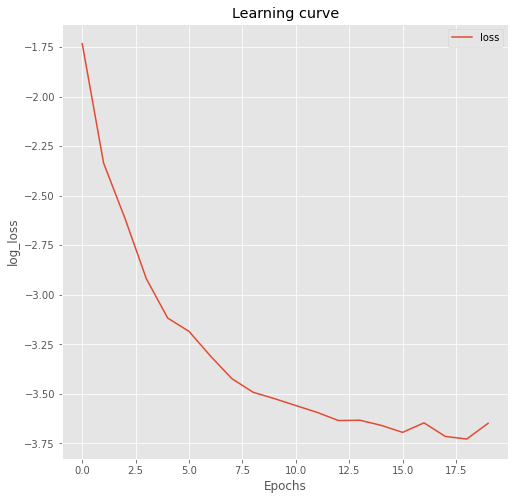

In [507]:
# plot learning rate
plt.figure(figsize=(8, 8))
plt.title("Learning curve")
plt.plot(trained_model.history["loss"], label="loss")
plt.xlabel("Epochs")
plt.ylabel("log_loss")
plt.legend();

###### This is a markdown cell to describe code functionality
The code below loads the best trained model from disk.

In [465]:
# load model
model = load_model(best_trained_model)

###### This is a markdown cell to describe code functionality
The code belows reads the only Test TOP and Ground Truth image from disk, performs augmentation by cutting it into 320x320 pieces and save them back to the disk.

In [467]:
# prepare testing data by augmentation
total_test_images = 0
im_x = Image.open(te_TOP_root)
imgwidth, imgheight = im_x.size
    
im_y = Image.open(te_GT_root)
    
i = 0
while i+im_height-1<imgheight:
    j = 0
    while j+im_width-1<imgwidth:
        # fix the window
        box = (j, i, j+im_width, i+im_height)
        # cut window
        x_segment = im_x.crop(box)
        y_segment = im_y.crop(box)
        # save
        total_test_images = total_test_images + 1
        x_segment.save(aug_te_TOP_root+str(total_test_images)+file_name_postfix)
        y_segment.save(aug_te_GT_root+str(total_test_images)+file_name_postfix)
        # increase j
        j = j + im_width
    # increase i
    i = i + im_height

###### This is a markdown cell to describe code functionality
The code below loads the augmented test set (original TOP images[normalized between 0 and 1], input TOP and Ground Truth[normalized to have mean 0.5 and std 0.5] images) into TOP_test, X_test, and y_test respectively. We performed semantic segmentation testing 12 images (12x320x320 pixels) that had buildings, backgrounds, and terrains altogether in the same image. We also stored two other images for simulated image generation [described later]

In [484]:
# prepare entire testing set
test_image_id = [0,3,7,10,11,13,19,22,27,28,29,33] # that has buildings, backgrounds, and terrains altogether
TOP_test = np.zeros((len(test_image_id), im_height, im_width, channels), dtype=np.float32)
X_test = np.zeros((len(test_image_id), im_height, im_width, channels), dtype=np.float32)
y_test = np.zeros((len(test_image_id), im_height, im_width, channels), dtype=np.float32)

# for simulation image generation
TOP_8 = None
X_8 = None
Y_8 = None
TOP_16 = None
X_16 = None
Y_16 = None

t = 0
im_ind = 0
# Load images
im_x = Image.open(te_TOP_root)
x_pixels = im_x.load()
imgwidth, imgheight = im_x.size
    
im_y = Image.open(te_GT_root)
y_pixels = im_y.load()
    
i = 0
while i+im_height-1<imgheight:
    j = 0
    while j+im_width-1<imgwidth:
        x_segment = np.zeros((im_height, im_width, channels), dtype=np.float32)
        y_segment = np.zeros((im_height, im_width, channels), dtype=np.float32)
        
        x = 0
        for m in range(i,i+im_height):
            y = 0
            for n in range(j,j+im_width):
                for o in range(0,channels):
                    x_segment[x][y][o] = x_pixels[n,m][o]
                    y_segment[x][y][o] = y_pixels[n,m][o]
                y = y + 1
            x = x + 1
        # add to test
        if t in test_image_id: 
            TOP_test[im_ind] = x_segment/255.0
            X_test[im_ind] = ((x_segment/255.0)-0.5)*0.5
            y_test[im_ind] = ((y_segment/255.0)-0.5)*0.5
            im_ind = im_ind + 1
        if t == 8:
            TOP_8 = x_segment/255.0
            X_8 = ((x_segment/255.0)-0.5)*0.5
            y_8 = ((y_segment/255.0)-0.5)*0.5
        if t == 16:
            TOP_16 = x_segment/255.0
            X_16 = ((x_segment/255.0)-0.5)*0.5
            y_16 = ((y_segment/255.0)-0.5)*0.5
            
        t = t+1
            
        # increase j
        j = j + im_width
    # increase i
    i = i + im_height

###### This is a markdown cell to describe code functionalities
The code below predicts labels for all test images.

In [474]:
# predict labels
predictions = model.predict(X_test, verbose=1)
print("Done")

12/12 [==============================] - 7s 596ms/step
Done


###### This is a markdown cell to describe code functionalities
The below code visualizes the test TOP images, corresponding Ground Truth images and predictions for all 12 test images.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

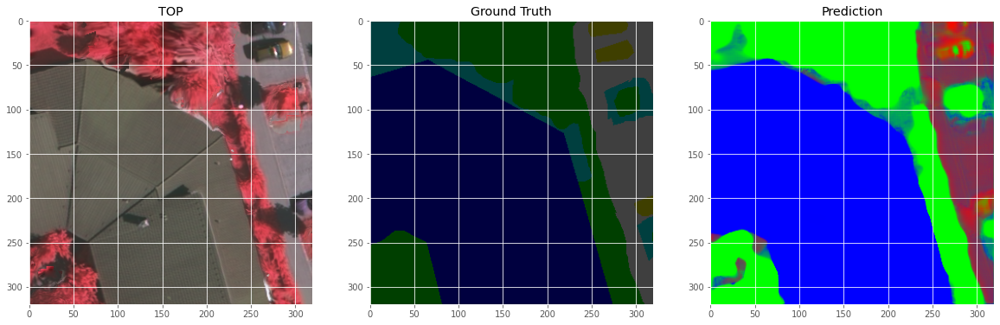

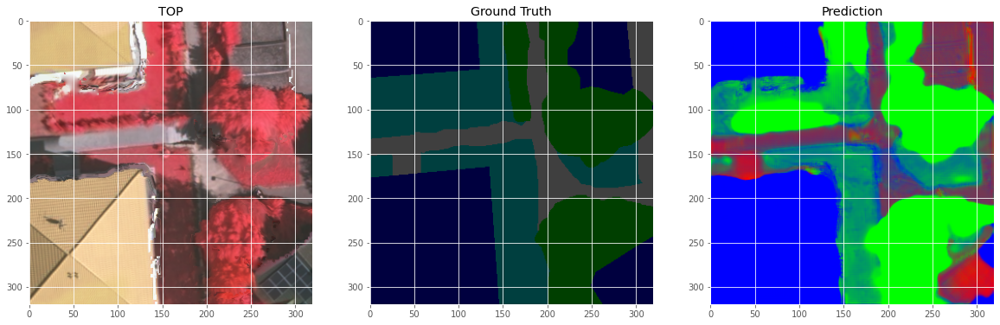

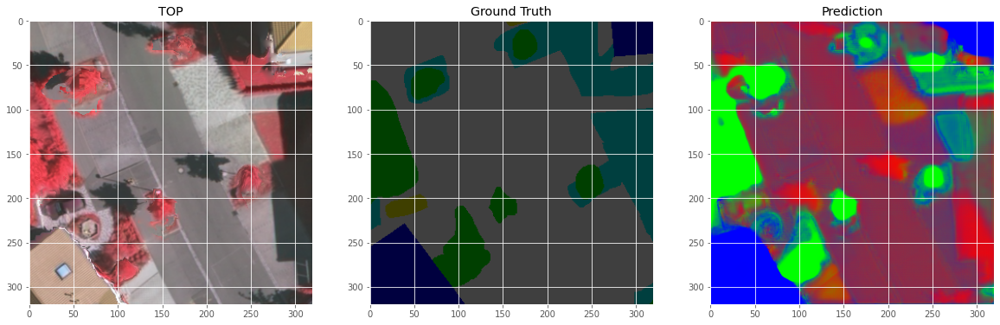

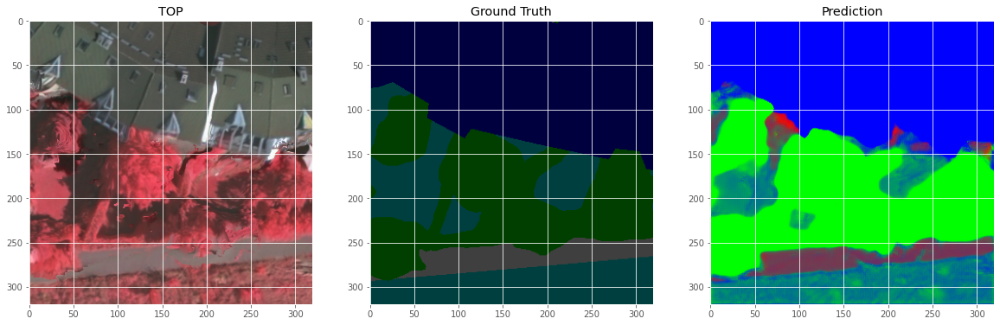

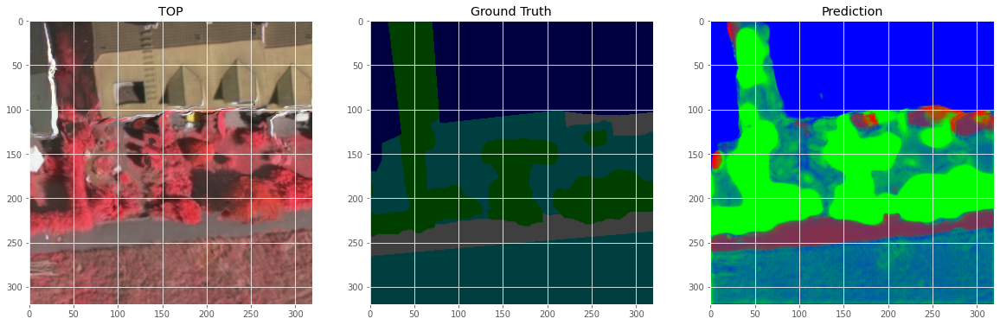

...

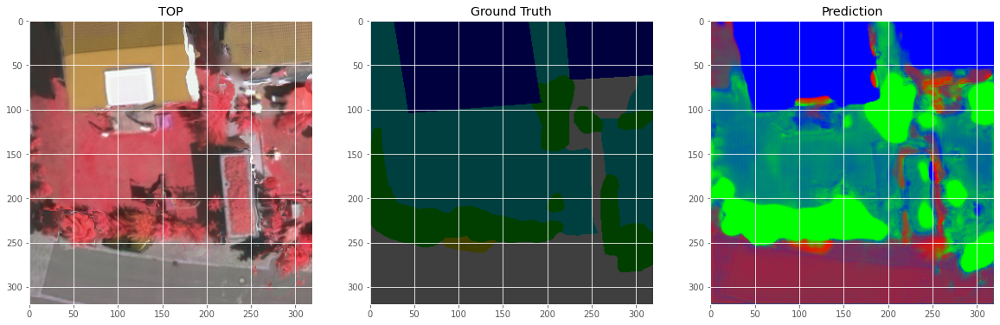

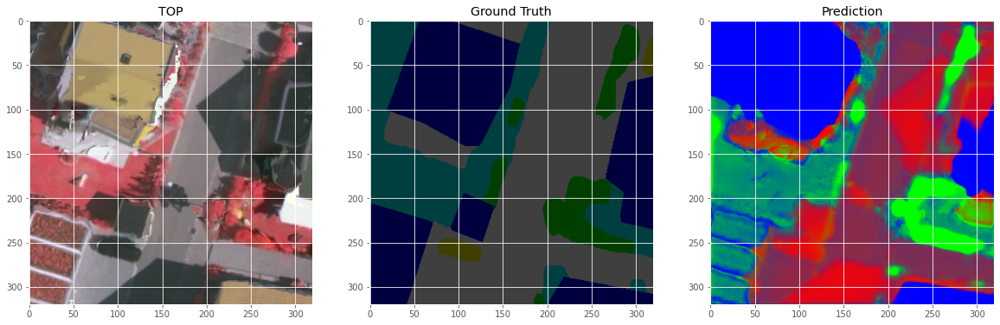

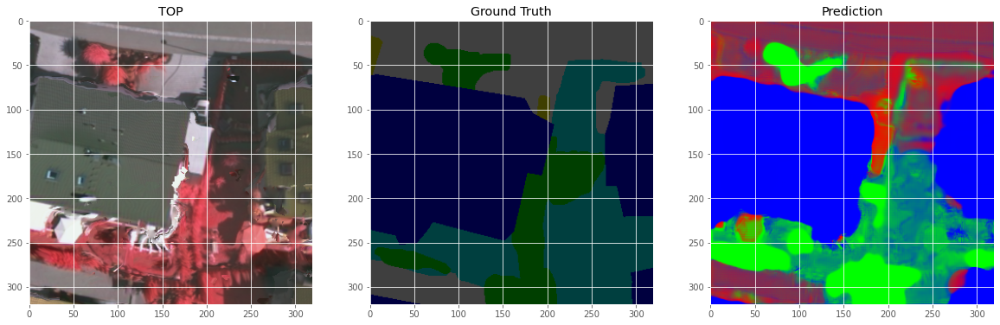

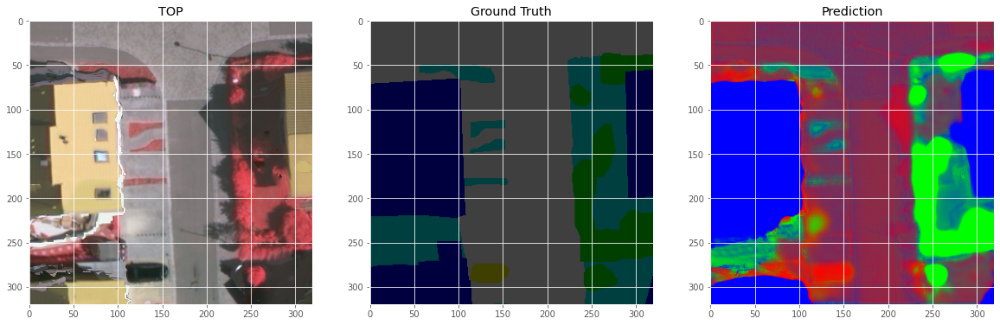

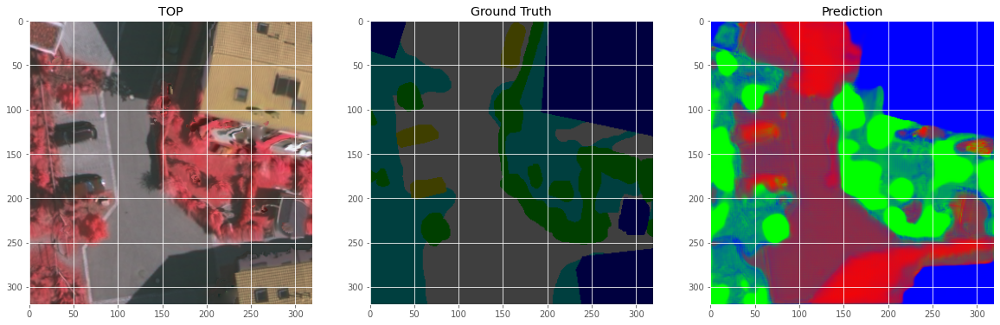

In [475]:
for i in range(0,len(test_image_id)):

    fig, ax = plt.subplots(1, 3, figsize=(20, 10))
    ax[0].imshow(TOP_test[i].squeeze())
    ax[0].set_title('TOP')

    ax[1].imshow(y_test[i].squeeze())
    ax[1].set_title('Ground Truth')

    ax[2].imshow(predictions[i].squeeze())
    ax[2].set_title('Prediction')

###### This is a markdown cell to describe code functionality
The code below evaluates the trained unet for semantic segmentation. It calculates overall accuracy, accuracy for Terrain (Class 0), Background (Class 1), and Buildings (Class 2) for each test image on a pixel basis. It also calculate average accuracies over all images. 

In [478]:
def PCC2(GT, prediction):
    # PCC2 simply calculates per pixel accuracy. If prediction for a pixel is equal to the ground truth, accuracy increases, decreases otherwise
    GT_classes = argmax(GT,-1)
    prediction_classes = argmax(prediction,-1)
    
    conf_matrix = confusion_matrix(GT_classes.numpy().flatten(),prediction_classes.numpy().flatten())
    
    h,w= GT_classes.shape
               
    accuracy = (conf_matrix[0][0]+conf_matrix[1][1]+conf_matrix[2][2])/(h*w)
    
    denom_0 = conf_matrix[0][0]+conf_matrix[0][1]+conf_matrix[0][2]
    class_0_acc = 0
    if denom_0 != 0:
        class_0_acc = conf_matrix[0][0]/(conf_matrix[0][0]+conf_matrix[0][1]+conf_matrix[0][2])
    
    denom_1 = conf_matrix[1][0]+conf_matrix[1][1]+conf_matrix[1][2]
    class_1_acc = 0
    if denom_1 != 0:
        class_1_acc = conf_matrix[1][1]/(conf_matrix[1][0]+conf_matrix[1][1]+conf_matrix[1][2])
        
    denom_2 = conf_matrix[2][0]+conf_matrix[2][1]+conf_matrix[2][2]
    class_2_acc = 0
    if denom_2 != 0:
        class_2_acc = conf_matrix[2][2]/(conf_matrix[2][0]+conf_matrix[2][1]+conf_matrix[2][2])
    
    return (accuracy*100,class_0_acc*100,class_1_acc*100,class_2_acc*100)


overall_accuracy = 0
background_acc = 0
terrain_acc = 0
building_acc = 0
for i in range(0,len(predictions)):
    print(i)
    accuracies = PCC2(y_test[i], predictions[i])
    overall_accuracy = overall_accuracy + accuracies[0]
    terrain_acc = terrain_acc + accuracies[1]
    background_acc = background_acc + accuracies[2]
    building_acc = building_acc + accuracies[3]
    print("Acc:"+str(accuracies[0])+"% Terrain:"+str(accuracies[1])+"% Background:"+str(accuracies[2]) +"% Building:"+ str(accuracies[3])+"%")
    
overall_accuracy = overall_accuracy/len(selected_test_images)
background_acc = background_acc/len(selected_test_images)
terrain_acc = terrain_acc/len(selected_test_images)
building_acc = building_acc/len(selected_test_images)

print("***********OVERALL***********")
print("accuracy:"+str(overall_accuracy)+"%")
print("Background:"+str(background_acc)+"%")
print("Terrain:"+str(terrain_acc)+"%")
print("Building:"+str(building_acc)+"%")


0
Acc:95.4052734375% Terrain:88.09493264913407% Background:92.29881998048089% Building:99.5377096816801%
1
Acc:80.0322265625% Terrain:61.33675359840388% Background:86.23958576656544% Building:78.50462237119532%
2
Acc:83.02734375% Terrain:87.41177174303147% Background:67.85480468465848% Building:98.45655962160816%
3
Acc:87.041015625% Terrain:68.16710343764451% Background:81.53707215750022% Building:97.57571273552334%
4
Acc:73.9638671875% Terrain:73.7062937062937% Background:63.05423451986357% Building:96.26802374893978%
5
Acc:85.1474609375% Terrain:90.19933014665236% Background:62.481710923637266% Building:99.63819451472523%
6
Acc:82.9970703125% Terrain:88.97640951636502% Background:66.43734498641786% Building:97.0813884865068%
7
Acc:78.3486328125% Terrain:82.39193847785732% Background:70.33503317431595% Building:93.92729663723465%
8
Acc:78.5458984375% Terrain:90.80213147222484% Background:66.65049384855311% Building:72.87444191051297%
9
Acc:81.892578125% Terrain:91.3626240129581% Backg

###### This is a markdown cell to describe code functionality
The code below calculates difference between two given image based on a given threshold and generates a differential image. If two pixels in the same location in the two images has a difference greater than the threshold, the corresponding pixel in the differential image is set to the pixel value of the second image, otherwise it is set to 0. This DI algorithm is adopted from the paper.

In [480]:
def calculate_DI(feat_map_image_1, feat_map_image_2, theta): # assuming both feature maps are square matrix and have the same dimensions

    if feat_map_image_1.shape[0] != feat_map_image_2.shape[0] or feat_map_image_1.shape[1] != feat_map_image_2.shape[1] or feat_map_image_1.shape[2] != feat_map_image_2.shape[2]:
        print("The shape of inputs must be same. Please give different inputs.")

    DI = list() # initialize the differential image
    for i in range(0,len(feat_map_image_1)):
        row = list()
        for j in range(0,len(feat_map_image_1[i])):
            channel = list()
            for k in range(0,len(feat_map_image_1[i][j])):
                channel.append(0)
            row.append(channel)    
        DI.append(row)
    DI_np_arr = np.array(DI)

    # calculate DI
    for i in range(0,len(feat_map_image_1)):
        for j in range(0,len(feat_map_image_1[i])):
            for k in range(0,len(feat_map_image_1[i][j])):
                if math.fabs(feat_map_image_1[i][j][k] - feat_map_image_2[i][j][k]) <= theta:
                    DI_np_arr[i][j][k] = 0
                else:
                    DI_np_arr[i][j][k] = feat_map_image_2[i][j][k]

    # retun the differential image
    return DI_np_arr

###### This is a markdown cell to describe  code functionality
The function, create_DI_image(img_1, img_2, model) in the code belowe, creates the final differential image using the algorithm described in the paper. It uses the calculate_DI(feat_map_image_1, feat_map_image_2, theta) function defined above. For each input image, the outputs from the 5 encoders are saved. Using the calculate_DI(feat_map_image_1, feat_map_image_2, theta) function the difference between each of the encoder output pairs are calculated. This differential images are applied to the decoder to get the final differential image.

In [482]:
def create_DI_image(img_1,img_2,model): # model is the trained unet
    
    # we want outputs from 
    # conv1 - 6
    # conv2 - 13
    # conv3 - 20
    # conv4 - 27
    # conv5 - 34
    encoder_1 = Model(inputs=model.input, outputs=model.layers[6].output)
    encoder_2 = Model(inputs=model.input, outputs=model.layers[13].output)
    encoder_3 = Model(inputs=model.input, outputs=model.layers[20].output)
    encoder_4 = Model(inputs=model.input, outputs=model.layers[27].output)
    encoder_5 = Model(inputs=model.input, outputs=model.layers[34].output)

    # print all layers
    {i: v for i, v in enumerate(model.layers)}
    
    # inference data set
    infer_data = np.zeros((2, im_height, im_width, channels), dtype=np.float32)
    infer_data[0] = img_1
    infer_data[1] = img_2


    # encoder outputs
    enc_1_out = encoder_1.predict(infer_data)
    enc_2_out = encoder_2.predict(infer_data)
    enc_3_out = encoder_3.predict(infer_data)
    enc_4_out = encoder_4.predict(infer_data)
    enc_5_out = encoder_5.predict(infer_data)

    # Encoder layer 1 output for image 1
    enc_l1_img1 = enc_1_out[0]
    # Encoder layer 2 output for image 1
    enc_l2_img1 = enc_2_out[0]
    # Encoder layer 3 output for image 1
    enc_l3_img1 = enc_3_out[0]
    # Encoder layer 4 output for image 1
    enc_l4_img1 = enc_4_out[0]
    # Encoder layer 5 output for image 1
    enc_l5_img1 = enc_5_out[0]


    # Encoder layer 1 output for image 2
    enc_l1_img2 = enc_1_out[1]
    # Encoder layer 2 output for image 2
    enc_l2_img2 = enc_2_out[1]
    # Encoder layer 3 output for image 2
    enc_l3_img2 = enc_3_out[1]
    # Encoder layer 4 output for image 2
    enc_l4_img2 = enc_4_out[1]
    # Encoder layer 5 output for image 2
    enc_l5_img2 = enc_5_out[1]


    # calculate differential images
    d1 = calculate_DI(enc_l1_img1,enc_l1_img2,0.4)
    d2 = calculate_DI(enc_l2_img1,enc_l2_img2,0.6)
    d3 = calculate_DI(enc_l3_img1,enc_l3_img2,0.8)
    d4 = calculate_DI(enc_l4_img1,enc_l4_img2,1.0)
    d5 = calculate_DI(enc_l5_img1,enc_l5_img2,1.2)
    
    # apply differential images on the decoders
    # d5 -> 35 ->
    input_shape = model.layers[35].input_shape
    layer_input = Input(shape=d5.shape)
    x = layer_input
    for layer in model.layers[35:38]:
        x = layer(x)
    dec_1 = Model(layer_input, x)
    d5_data = np.zeros((1, 20, 20, 1024), dtype=np.float32)
    d5_data[0] = d5
    dec_1_out = dec_1.predict(d5_data)

    # 37+d4 -> decoder layer 2 - 38 ->
    dec_2_input = np.concatenate((d4,dec_1_out[0]),axis=2)
    layer_input = Input(shape=dec_2_input.shape)
    x = layer_input
    for layer in model.layers[39:48]:
        x = layer(x)
    dec_2 = Model(layer_input, x)
    d4_data = np.zeros((1, 40, 40, 768), dtype=np.float32)
    d4_data[0] = dec_2_input
    dec_2_out = dec_2.predict(d4_data)

    # 47+d3 -> decoder layer 3 - 48 ->
    dec_3_input = np.concatenate((d3,dec_2_out[0]),axis=2)
    layer_input = Input(shape=dec_3_input.shape)
    x = layer_input
    for layer in model.layers[49:58]:
        x = layer(x)
    dec_3 = Model(layer_input, x)
    d3_data = np.zeros((1, 80, 80, 512), dtype=np.float32)
    d3_data[0] = dec_3_input
    dec_3_out = dec_3.predict(d3_data)

    # 57+d2 -> decoder layer 4 - 58 ->
    dec_4_input = np.concatenate((d2,dec_3_out[0]),axis=2)
    layer_input = Input(shape=dec_4_input.shape)
    x = layer_input
    for layer in model.layers[59:68]:
        x = layer(x)
    dec_4 = Model(layer_input, x)
    d4_data = np.zeros((1, 160, 160, 256), dtype=np.float32)
    d4_data[0] = dec_4_input
    dec_4_out = dec_4.predict(d4_data)
    
    # 67+d1 -> decoder layer 5 - 68 -> (output)
    dec_5_input = np.concatenate((d1,dec_4_out[0]),axis=2)
    layer_input = Input(shape=dec_5_input.shape)
    x = layer_input
    for layer in model.layers[69:]:
        x = layer(x)
    dec_5 = Model(layer_input, x)
    d5_data = np.zeros((1, 320, 320, 128), dtype=np.float32)
    d5_data[0] = dec_5_input
    dec_5_out = dec_5.predict(d5_data)
    
    return dec_5_out

    
    

###### This is a markdown cell to describe code functionalities
For the evaluation of the change detection/differential image generation algorithm proposed in the paper, we generated 6 simulated images following the same method described in the paper. We selected an image from our test set and changed it to 5%, 10%, and 15% to generate the first 3 simulated image. To generate the last three simulated image, we introduced Gaussian noise with variance 10, 20, and 40 to the 5% changed image. Based on this 6 simulated image we evaluated the change detection algorithm. The code below generates all the simulated image and visualize them.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Gaussian Noise with Variance 40')

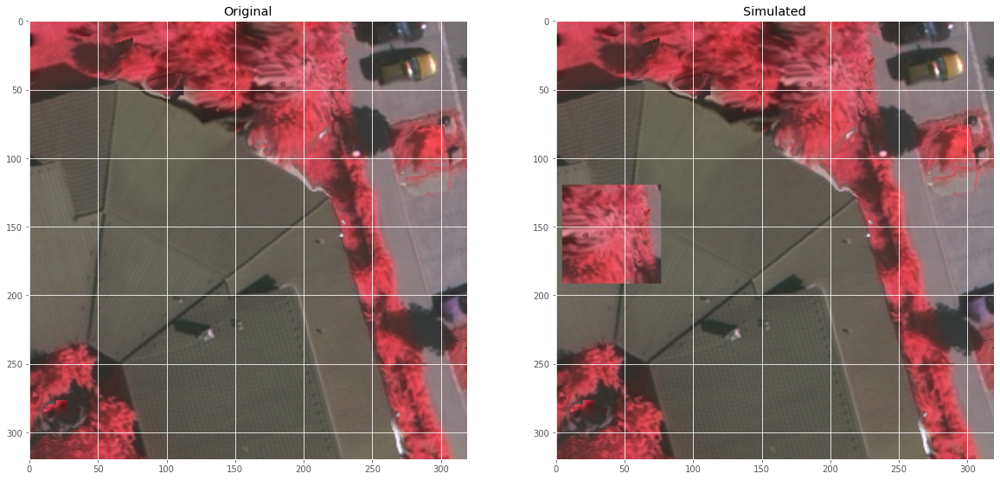

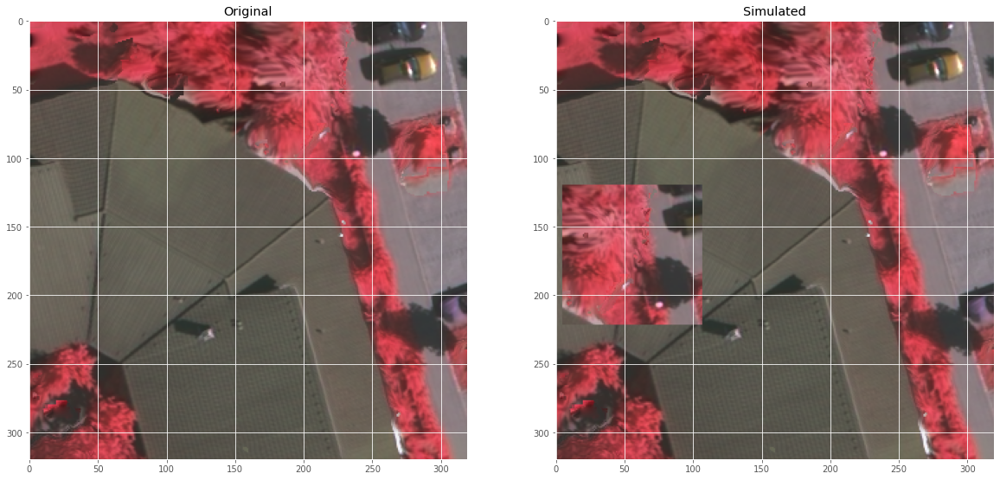

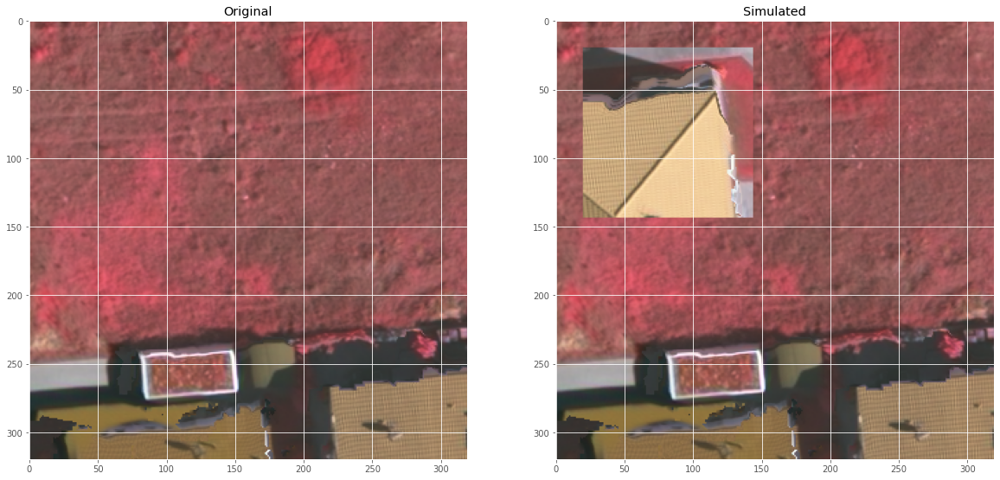

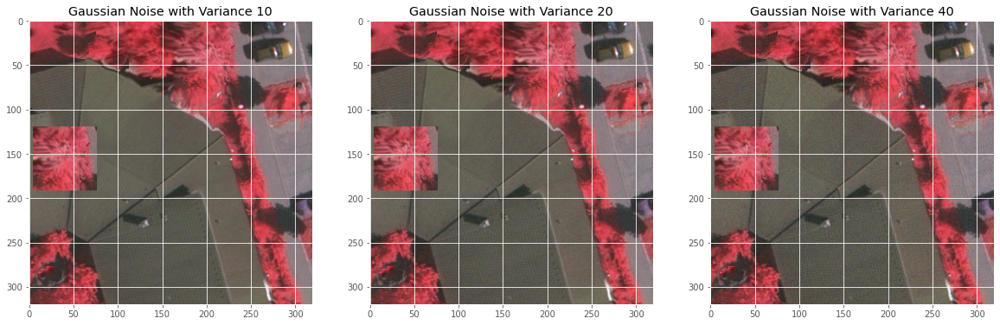

In [485]:
# generate simulated image

# simulated image 1
simu_1 = np.copy(TOP_test[0]) # 5%
# paste_region_1 - 120, 5, 192, 77
# copy_region_1 - 10, 168, 82, 240
x = 120
for i in range(10,82):
    y = 5
    for j in range(168,240):
        for k in range(0,channels):
            simu_1[x][y][k] = TOP_test[0][i][j][k]
            
        y = y + 1
        
    x = x + 1
    
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(TOP_test[0])
ax[0].set_title('Original')
ax[1].imshow(simu_1)
ax[1].set_title('Simulated')

simu_2 = np.copy(TOP_test[0]) # 5%
# paste_region_2 - 120, 5, 222, 107
# copy_region_2 - 10, 168, 112, 270
x = 120
for i in range(10,112):
    y = 5
    for j in range(168,270):
        for k in range(0,channels):
            simu_2[x][y][k] = TOP_test[0][i][j][k]
            
        y = y + 1
        
    x = x + 1
    
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(TOP_test[0])
ax[0].set_title('Original')
ax[1].imshow(simu_2)
ax[1].set_title('Simulated')

simu_3 = np.copy(TOP_16) # 15%
# paste_region_3 - 20,20,144,144 on image 17
# copy_region_3 - 70,130,194,254 from image 9
x = 20
for i in range(70,194):
    y = 20
    for j in range(130,254):
        for k in range(0,channels):
            simu_3[x][y][k] = TOP_8[i][j][k]
            
        y = y + 1
        
    x = x + 1
    
fig, ax = plt.subplots(1, 2, figsize=(20, 10))
ax[0].imshow(TOP_16)
ax[0].set_title('Original')
ax[1].imshow(simu_3)
ax[1].set_title('Simulated')
            
# noisy image creation
def add_gaussian_noise(variance,image):
    row,col,ch= image.shape
    mean = 0
    var = variance
    sigma = var**0.5
    gauss = np.random.normal(mean,sigma,(row,col,ch))
    gauss = gauss.reshape(row,col,ch)
    noisy_image = image + gauss
    original = TOP_test[0]*255.0 + gauss
    return (noisy_image,original)

# add noise to only 5% changed simulated image
# gaussian noise with variance 10
noisy_images_1 = add_gaussian_noise(10,simu_1*255.0)
noisy_image_arr_1 = noisy_images_1[0]
original_1 = noisy_images_1[1]
# gaussian noise with variance 20
noisy_images_2 = add_gaussian_noise(20,simu_1*255.0)
noisy_image_arr_2 = noisy_images_2[0]
original_2 = noisy_images_2[1]
# gaussian noise with variance 40
noisy_images_3 = add_gaussian_noise(40,simu_1*255.0)
noisy_image_arr_3 = noisy_images_3[0] 
original_3 = noisy_images_3[1]

fig, ax = plt.subplots(1, 3, figsize=(20, 10))
ax[0].imshow(noisy_image_arr_1/255.0)
ax[0].set_title('Gaussian Noise with Variance 10')
ax[1].imshow(noisy_image_arr_2/255.0)
ax[1].set_title('Gaussian Noise with Variance 20')
ax[2].imshow(noisy_image_arr_3/255.0)
ax[2].set_title('Gaussian Noise with Variance 40')


###### This is a markdown cell to describe code functionality
The function auxPCC2(GT, detected_chng, chng_mask) in the code below evaluates if a pixel is changed in subsequent images and detected as changed, if the proposed algorithm can also finds the correct class for the changed pixel or not.

In [486]:
def auxPCC2(GT, detected_chng, chng_mask):
    # PCC2 = CC / (CC + IC)
    GT_classes = argmax(GT,-1)
    detected_classes = argmax(detected_chng,-1)
    
    h,w= GT_classes.shape
    CC = 0 # correct class
    IC = 0 # incorrect class
    for i in range(0,h):
        for j in range(0,w):
            if chng_mask[i][j][0] == 1 and chng_mask[i][j][1] == 1 and chng_mask[i][j][2] == 1: 
                if GT_classes[i][j] == detected_classes[i][j]:
                    CC = CC + 1 
                else:
                    IC = IC + 1

    accuracy = (CC/(CC+IC))*100
    print("PCC2:"+str(accuracy)+"%")

###### This is a markdown cell to describe code functionality
The PCC1(img_1, img_2, GT, detected_chng) function evaluates change detection on a per pixel basis. If a chaged pixel is identified as changed, PCC1 increases. PCC1 decreases for wrong identification.

In [487]:
def PCC1(img_1, img_2, GT, detected_chng): # img_1, img_2, and detected_chng must have the same shape
    height, width, channels = img_1.shape
    chng_mask = np.zeros(shape=(height,width,channels))
    no_chng_label = 2 # if there is no change pixel color is shifted towards blue
    TP = 0
    TN = 0
    FP = 0
    FN = 0
    
    detected_chng_labels = argmax(detected_chng,-1)
    for i in range(0,height):
        for j in range(0,width):
            equal_flag = 1
            for k in range(0, channels):
                if img_1[i][j][k] != img_2[i][j][k]:
                    equal_flag = 0
                    break
            if equal_flag == 0: # change detected
                chng_mask[i][j][0] = 1
                chng_mask[i][j][1] = 1
                chng_mask[i][j][2] = 1
                # calculate FN
                if detected_chng_labels[i][j] == no_chng_label and detected_chng_labels[i][j] == no_chng_label and detected_chng_labels[i][j] == no_chng_label:
                    FN = FN + 1
                # calculate TP
                else:
                    TP = TP + 1
                
            else: # no change
                # calculate TN
                if detected_chng_labels[i][j] == no_chng_label and detected_chng_labels[i][j] == no_chng_label and detected_chng_labels[i][j] == no_chng_label:
                    TN = TN + 1
                # calculate FP
                else:
                    FP = FP + 1
    fig, ax = plt.subplots(1,1, figsize=(20, 10))
    ax.imshow(chng_mask)
    ax.set_title('Change Mask')
    
    auxPCC2(GT, detected_chng, chng_mask)
                
            
    PCC1 = ((TP + TN) / (TP + TN + FP + FN))*100
    return PCC1


###### This is a markdown cell to describe code functionality
The 6 code cells below apply create_DI_image(img_1,img_2,model) method on our 6 test cases. Visualize the change mask, original images and differential images. Each code cell also calculates PCC1 and PCC2 for the test cases.  

1/1 [==============================] - 1s 644ms/step
PCC2:87.86651234567901%
PCC1:99.2421875%


Text(0.5, 1.0, 'Detected Change')

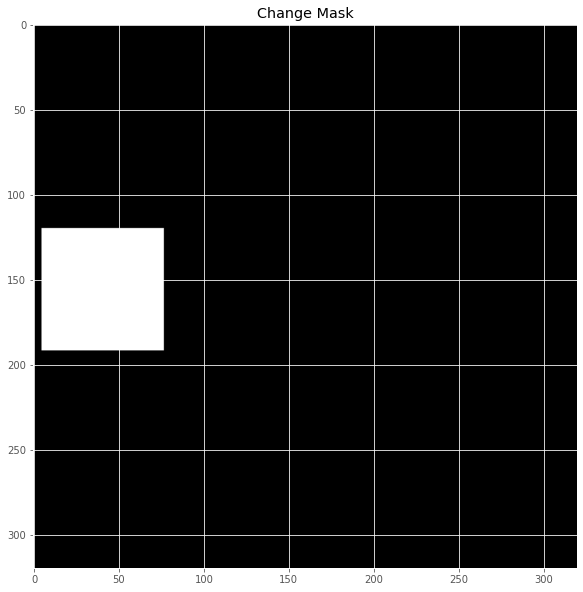

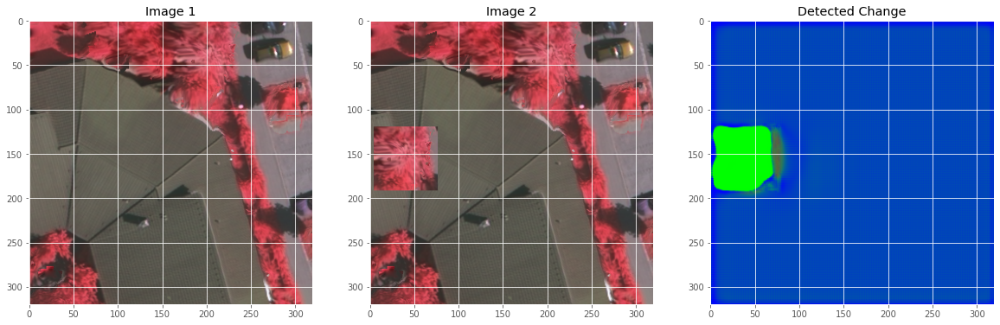

In [488]:
# evaluation of change detection
# test case 1 (5% change)
# image 1
img_1 = X_test[0]

# image 2
img_2 = (simu_1-0.5)*0.5

# get ground truth for image 2
predict_img_2 = np.zeros((1, im_height, im_width, channels), dtype=np.float32)
predict_img_2[0] = img_2
predictions_img_2 = model.predict(predict_img_2, verbose=1)
GT = predictions_img_2[0]

# DI image
DI_image = create_DI_image(img_1,img_2,model)

# accuracy
accuracy = PCC1(img_1,img_2,GT,DI_image[0])
print("PCC1:"+str(accuracy)+"%")

fig, ax = plt.subplots(1, 3, figsize=(20, 10))
ax[0].imshow(TOP_test[0])
ax[0].set_title('Image 1')
ax[1].imshow(simu_1)
ax[1].set_title('Image 2')
ax[2].imshow(DI_image[0])
ax[2].set_title('Detected Change')


1/1 [==============================] - 1s 640ms/step
PCC2:61.46674356016917%
PCC1:97.8251953125%


Text(0.5, 1.0, 'Detected Change')

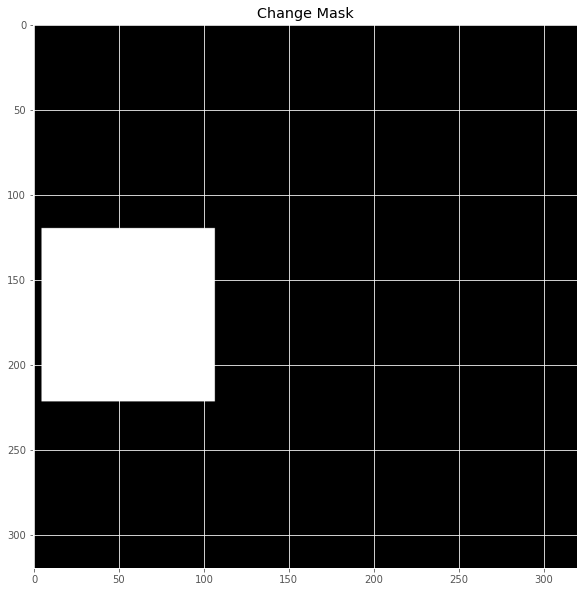

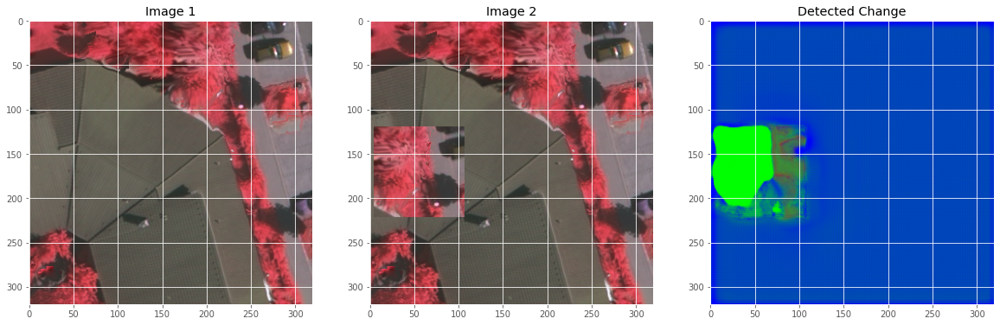

In [489]:
# test case 2 (10% change)
# image 1
img_1 = X_test[0]

# image 2
img_2 = (simu_2-0.5)*0.5

# get ground truth for image 2
predict_img_2 = np.zeros((1, im_height, im_width, channels), dtype=np.float32)
predict_img_2[0] = img_2
predictions_img_2 = model.predict(predict_img_2, verbose=1)
GT = predictions_img_2[0]

# DI image
DI_image = create_DI_image(img_1,img_2,model)

# accuracy
accuracy = PCC1(img_1,img_2,GT,DI_image[0])
print("PCC1:"+str(accuracy)+"%")


fig, ax = plt.subplots(1, 3, figsize=(20, 10))
ax[0].imshow(TOP_test[0])
ax[0].set_title('Image 1')
ax[1].imshow(simu_2)
ax[1].set_title('Image 2')
ax[2].imshow(DI_image[0])
ax[2].set_title('Detected Change')

1/1 [==============================] - 1s 632ms/step
PCC2:78.66805411030177%
85.5673828125


Text(0.5, 1.0, 'Detected Change')

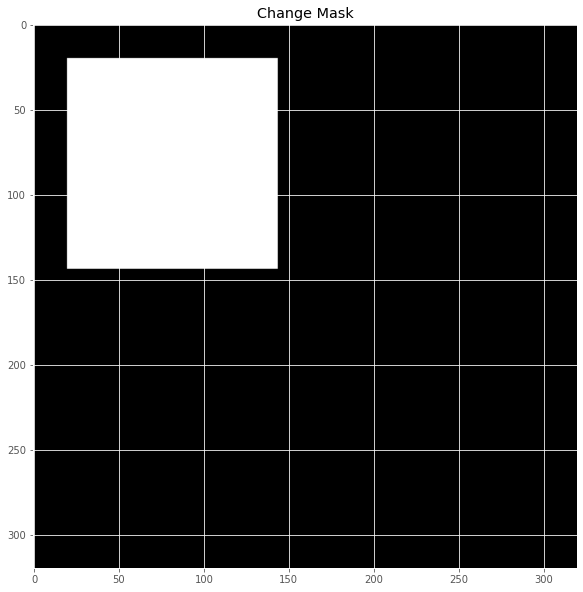

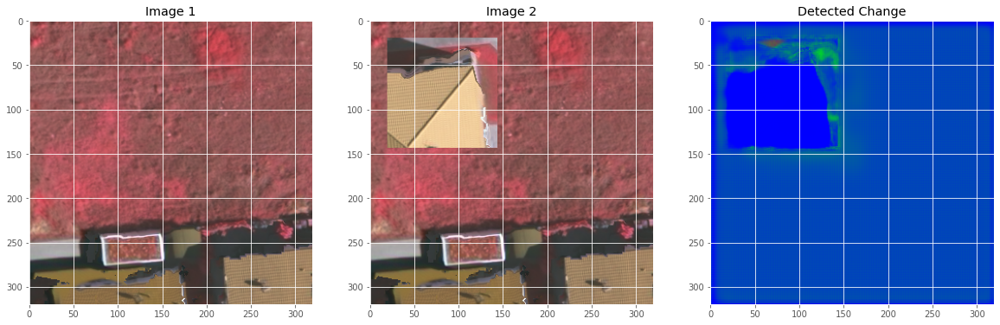

In [491]:
# test case 3 (15% change)
# image 1
img_1 = X_16

# image 2
img_2 = (simu_3-0.5)*0.5

# get ground truth for image 2
predict_img_2 = np.zeros((1, im_height, im_width, channels), dtype=np.float32)
predict_img_2[0] = img_2
predictions_img_2 = model.predict(predict_img_2, verbose=1)
GT = predictions_img_2[0]

# DI image
DI_image = create_DI_image(img_1,img_2,model)

# accuracy
accuracy = PCC1(img_1,img_2,GT,DI_image[0])
print(accuracy)


fig, ax = plt.subplots(1, 3, figsize=(20, 10))
ax[0].imshow(TOP_16)
ax[0].set_title('Image 1')
ax[1].imshow(simu_3)
ax[1].set_title('Image 2')
ax[2].imshow(DI_image[0])
ax[2].set_title('Detected Change')

1/1 [==============================] - 1s 635ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PCC2:88.77314814814815%
PCC1:99.251953125%


Text(0.5, 1.0, 'Detected Change')

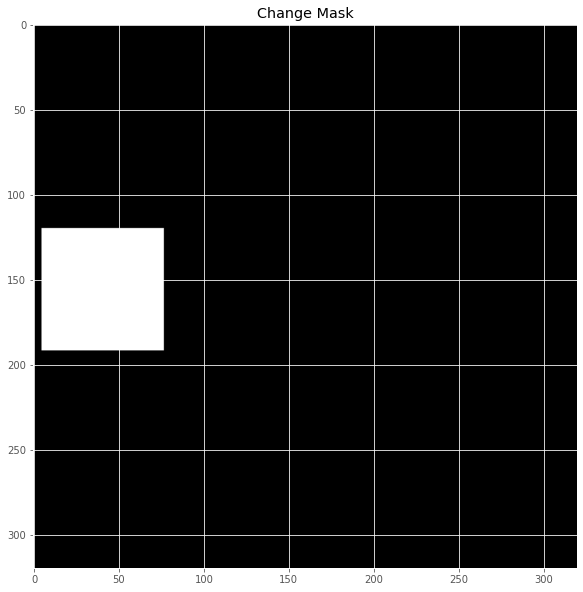

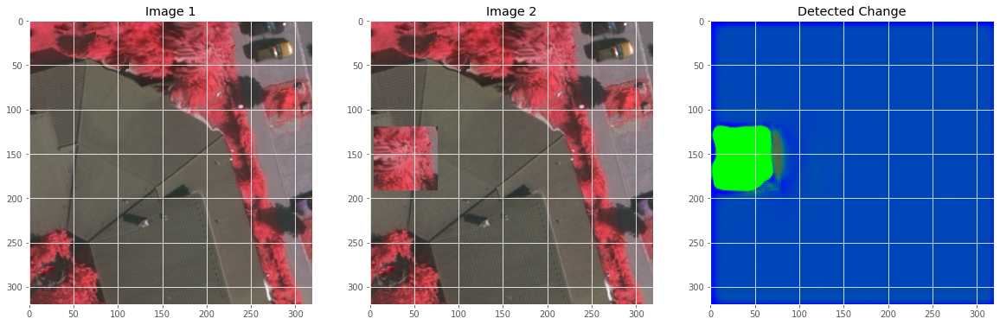

In [492]:
# test case 4 (5% change + gaussian noise with variance 10)
# image 1
img_1 = ((original_1/255.0)-0.5)*0.5

# image 2
img_2 = ((noisy_image_arr_1/255.0)-0.5)*0.5

# get ground truth for image 2
predict_img_2 = np.zeros((1, im_height, im_width, channels), dtype=np.float32)
predict_img_2[0] = img_2
predictions_img_2 = model.predict(predict_img_2, verbose=1)
GT = predictions_img_2[0]

# DI image
DI_image = create_DI_image(img_1,img_2,model)

# accuracy
accuracy = PCC1(img_1,img_2,GT,DI_image[0])
print("PCC1:"+str(accuracy)+"%")


fig, ax = plt.subplots(1, 3, figsize=(20, 10))
ax[0].imshow(TOP_test[0])
ax[0].set_title('Image 1')
ax[1].imshow(noisy_image_arr_1/255.0)
ax[1].set_title('Image 2')
ax[2].imshow(DI_image[0])
ax[2].set_title('Detected Change')

1/1 [==============================] - 1s 686ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PCC2:88.6381172839506%
PCC1:99.234375%


Text(0.5, 1.0, 'Detected Change')

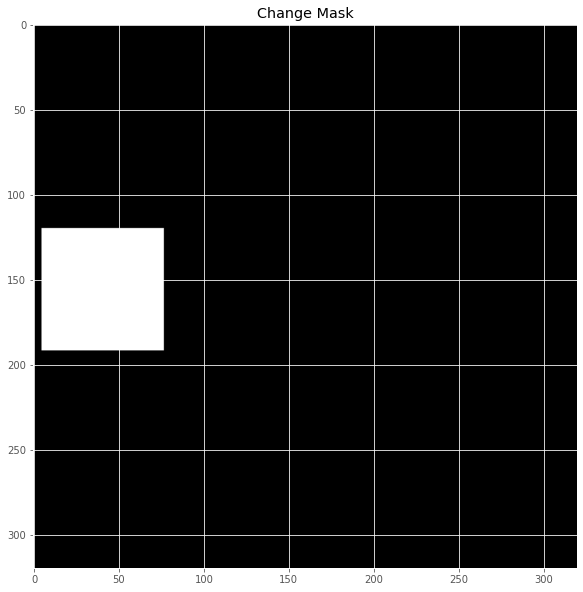

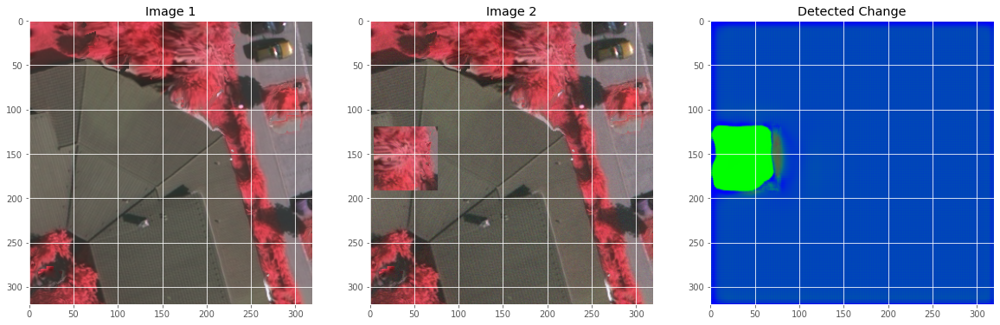

In [493]:
# test case 5 (5% change + gaussian noise with variance 20)
# image 1
img_1 = ((original_2/255.0)-0.5)*0.5

# image 2
img_2 = ((noisy_image_arr_2/255.0)-0.5)*0.5

# DI image
DI_image = create_DI_image(img_1,img_2,model)

# get ground truth for image 2
predict_img_2 = np.zeros((1, im_height, im_width, channels), dtype=np.float32)
predict_img_2[0] = img_2
predictions_img_2 = model.predict(predict_img_2, verbose=1)
GT = predictions_img_2[0]

# accuracy
accuracy = PCC1(img_1,img_2,GT,DI_image[0])
print("PCC1:"+str(accuracy)+"%")

fig, ax = plt.subplots(1, 3, figsize=(20, 10))
ax[0].imshow(TOP_test[0])
ax[0].set_title('Image 1')
ax[1].imshow(noisy_image_arr_2/255.0)
ax[1].set_title('Image 2')
ax[2].imshow(DI_image[0])
ax[2].set_title('Detected Change')

1/1 [==============================] - 1s 739ms/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


PCC2:89.19753086419753%
99.2099609375


Text(0.5, 1.0, 'Detected Change')

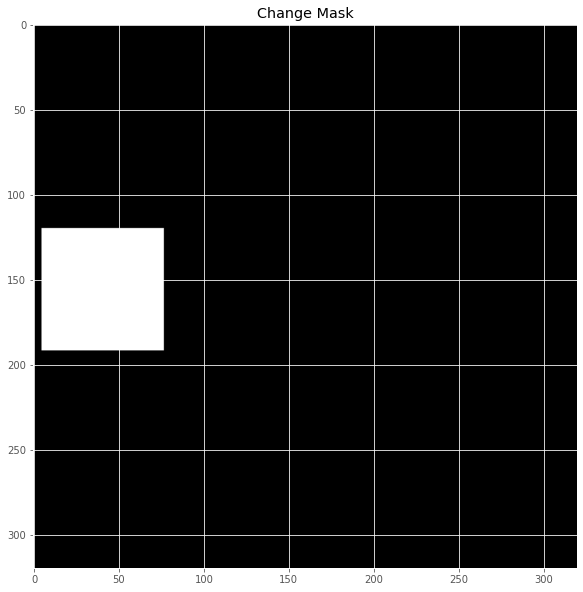

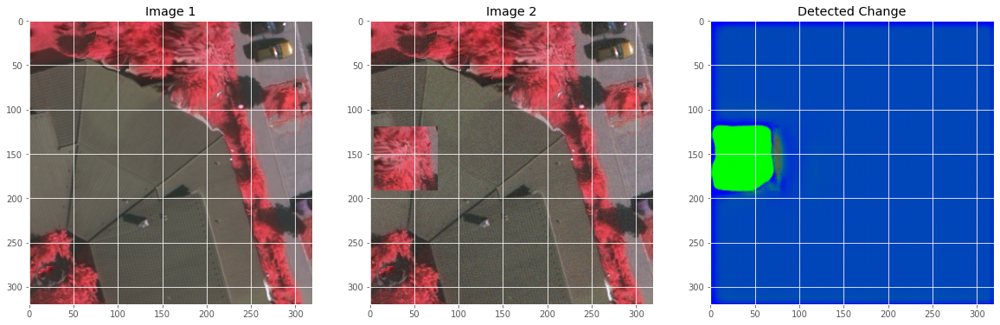

In [494]:
# test case 6 (5% change + gaussian noise with variance 40)
# image 1
img_1 = ((original_3/255.0)-0.5)*0.5

# image 2
img_2 = ((noisy_image_arr_3/255.0)-0.5)*0.5

# DI image
DI_image = create_DI_image(img_1,img_2,model)

# get ground truth for image 2
predict_img_2 = np.zeros((1, im_height, im_width, channels), dtype=np.float32)
predict_img_2[0] = img_2
predictions_img_2 = model.predict(predict_img_2, verbose=1)
GT = predictions_img_2[0]

# accuracy
accuracy = PCC1(img_1,img_2,GT,DI_image[0])
print(accuracy)

fig, ax = plt.subplots(1, 3, figsize=(20, 10))
ax[0].imshow(TOP_test[0])
ax[0].set_title('Image 1')
ax[1].imshow(noisy_image_arr_3/255.0)
ax[1].set_title('Image 2')
ax[2].imshow(DI_image[0])
ax[2].set_title('Detected Change')

In [495]:
print("DONE!!!")

DONE!!!
